<a href="https://colab.research.google.com/github/enzocatorano/deep_learning_practicas/blob/master/8_embeddings_cbow_lotr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aprendizaje Profundo FICH: Procesamiento del lenguaje natural

## Embedding de palabras

En esta notebook vamos a entrenar de cero una red (simplificada) Word2Vec, en particular la variante "bolsa de palabras continua" (CBOW).

In [4]:
import numpy as np
from matplotlib import pyplot as plt

import torch as tr
from torch.utils.data import DataLoader, Dataset

from tqdm.notebook import tqdm

## Dataset: Trilogía "Lord Of The Rings"

Vamos a utilizar los libros de Tolkien para entrenar la red. Esperamos obtener un embedding razonable que represente conceptos básicos. Como referencia, una de las versiones más usadas de Word2Vec fue entrenada con un dataset basado en GoogleNews, con **10^9 palabras**.

En la siguiente celda levantamos el texto crudo y lo dividimos en oraciones.

In [6]:
sentences = []
nwords = 0
for book in ["sample_data/felowship_of_the_ring.txt", "sample_data/two_towers.txt", "sample_data/the_return_of_the_king.txt"]:
    for line in open(book):
        # Descarta lineas en blanco y cosas raras
        line = line.strip(" \n")
        if len(line)<5:
            continue

        for sentence in line.split("."):
            sentence = sentence.strip(" \n")
            if len(sentence)<5:
                continue

            sentences.append(sentence)
            nwords += len(sentence.split())

print(f"{len(sentences)} oraciones ({nwords} palabras)")
k = np.random.randint(0, len(sentences))
print(f"Ejemplo oración {k}:\n{sentences[k]}")

31822 oraciones (477742 palabras)
Ejemplo oración 27818:
Sam sprang over the body and went in; and then he peered about at a loss


In [9]:
!pip install flair

In [10]:
from flair.data import Sentence # Tokenizer por defecto de Flair
from collections import Counter # Para sacar frecuencias


class WordsDataset(Dataset):

    def __init__(self, sentences, context=8, min_freq=0):
        """
        Parameters
        ----------
        paragraphs : list[str]
            Lista de textos (oraciones o varias oraciones)
        context : int
            Tamaño del contexto a generar para cada palabra (numero par)
        min_freq : int
            Cantidad mínima de apariciones de una palabra para considerarse en el vocabulario
        """

        self.context = context
        # Se guarda el indexado al texto original solo para desarrollo/debug
        self.sentences, self.sentences_id = self.preprocess(sentences, context)

        self.freq = Counter()
        print("Frecuencia de aparición de las palabras...")
        for s in self.sentences:
            self.freq.update(s)

        print("Generación de vocabulario...")
        self.freq = Counter({w: self.freq[w] for w in self.freq if self.freq[w]>=min_freq})
        self.vocab = {w: k for k, w in enumerate(self.freq)}

        # Agregamos un token para el padding
        self.vocab["/PAD/"] = len(self.vocab)
        self.vocab_size = len(self.vocab)

        print("Reemplazo de palabras por índices del vocabulario...")
        nwords = 0
        for k in tqdm(range(len(self.sentences))):
            self.sentences[k] = tr.tensor([self.vocab[w] for w in self.sentences[k] if w in self.vocab], dtype=int)
            nwords += len(self.sentences[k])

        # se limpian oraciones que hayan quedado mas cortas que el contexto definido
        ind = [len(s)>context for s in self.sentences]
        self.sentences = [s for i, s in zip(ind, self.sentences) if i]
        self.sentences_id = [s for i, s in zip(ind, self.sentences_id) if i]

        # Diccionario invertido (por comodidad)..."
        self.inverse_vocab = {self.vocab[word]: word for word in self.vocab}

        print(f"{len(self.sentences)} oraciones, {nwords} palabras. Tamaño de vocabulario: {len(self.vocab)}")

    def preprocess(self, sentences, context):
        """ Función básica de preprocesamiento de palabras. Se usa un tokenizado simple eliminando signos de
        puntuación y separando por espacios. Se eliminan las frases que tengan menos palabras que "context".
        """
        print("Preprocesamiento...")

        output, ids = [], []
        for k, sentence in enumerate(tqdm(sentences)):

            # flair.data.Sentence facilita la tokenización (es un poco más lento porque hace otras cosas)
            sentence = [w.text.lower() for w in Sentence(sentence)]

            if len(sentence) <= context + 1:
                continue

            output.append(sentence)
            ids.append(k)
        return output, ids

    def __len__(self):
        return len(self.sentences)

    def __getitem__(self, item):
        """
        Cada ejemplo consiste en tomar una palabra aleatoria de la oración "item", junto a su contexto.
        """
        L = len(self.sentences[item])
        target_ind = np.random.randint(0, L)

        start = max(0, target_ind-self.context//2)
        end = min(L, target_ind+self.context//2+1)

        context_ind = [l for l in range(start, end) if l != target_ind]

        # Contexto vacío
        context_words = tr.ones(self.context).long() * self.vocab["/PAD/"]
        # Agregamos el contexto que tenga target (en este caso no importa el orden)
        context_words[:len(context_ind)] = self.sentences[item][context_ind]

        return context_words, self.sentences[item][target_ind], self.sentences_id[item]

    def get_ind(self, tokens):
        return [self.vocab[t] for t in tokens]

    def get_text(self, ind):
        if type(ind) is not int:
            ind = [i for i in ind if i!=-1]
            return " ".join([self.inverse_vocab[c.item()] for c in ind])
        else:
            if ind in self.inverse_vocab:
                return self.inverse_vocab[ind]
            else:
                return "unknown"

data = WordsDataset(sentences)


Preprocesamiento...


  0%|          | 0/31822 [00:00<?, ?it/s]

Frecuencia de aparición de las palabras...
Generación de vocabulario...
Reemplazo de palabras por índices del vocabulario...


  0%|          | 0/21907 [00:00<?, ?it/s]

21907 oraciones, 475504 palabras. Tamaño de vocabulario: 13676


***
Quiero explorar bien que hace la clase esta

In [63]:
oraciones = ['Tres tristes tigres tragan trigo en un trigal.',
             'Sueñan los androides con ovejas electricas?',
             'Si la implementación es difícil de explicar, es una mala idea.',
             'Función básica de preprocesamiento de palabras.',
             'Ejemplo para explorar como funciona la clase.']

ds = WordsDataset(oraciones, context = 4, min_freq = 0)
print('\n')
print(f'La cantidad de oraciones validas es : {len(ds)}')
print(f"Tamaño de vocabulario (incluye /PAD/): {ds.vocab_size}")
print("Vocabulario (palabra → índice):")
for w, idx in ds.vocab.items():
    print(f"  {w:>12} → {idx}")

most_common = ds.freq.most_common(10)
print("10 palabras más frecuentes:")
for w, f in most_common:
    print(f" - {w}: {f}")

samples = 3
print(f"\n--> Mostrando {samples} ejemplos aleatorios:")
for idx in np.random.choice(len(ds), size=samples, replace=False):
    # Datos del ejemplo
    context_idxs, target_idx, sent_id = ds[idx]
    raw_text = oraciones[sent_id]
    token_list = ds.sentences[idx].tolist()  # lista de índices
    tokens_text = [ds.inverse_vocab[i] for i in token_list]

    # Contexto concreto
    context_indices = context_idxs.tolist()
    context_words = [ds.inverse_vocab[i] for i in context_indices]
    target_word = ds.inverse_vocab[int(target_idx)]

    # Impresión detallada
    print(f"\nEjemplo dataset index = {idx} (sentence_id = {sent_id}):")
    print(f"  Oración original: {raw_text}")
    print(f"  Tokens preprocesados: {tokens_text}")
    print(f"  Tensor de índices tokens: {token_list}")
    print(f"  Contexto índices: {context_indices}")
    print(f"  Contexto palabras: {context_words}")
    print(f"  Target índice = {int(target_idx)} -> palabra: '{target_word}'")

Preprocesamiento...


  0%|          | 0/5 [00:00<?, ?it/s]

Frecuencia de aparición de las palabras...
Generación de vocabulario...
Reemplazo de palabras por índices del vocabulario...


  0%|          | 0/5 [00:00<?, ?it/s]

5 oraciones, 44 palabras. Tamaño de vocabulario: 38


La cantidad de oraciones validas es : 5
Tamaño de vocabulario (incluye /PAD/): 38
Vocabulario (palabra → índice):
          tres → 0
       tristes → 1
        tigres → 2
        tragan → 3
         trigo → 4
            en → 5
            un → 6
        trigal → 7
             . → 8
        sueñan → 9
           los → 10
     androides → 11
           con → 12
        ovejas → 13
    electricas → 14
             ? → 15
            si → 16
            la → 17
  implementación → 18
            es → 19
       difícil → 20
            de → 21
      explicar → 22
             , → 23
           una → 24
          mala → 25
          idea → 26
       función → 27
        básica → 28
  preprocesamiento → 29
      palabras → 30
       ejemplo → 31
          para → 32
      explorar → 33
          como → 34
      funciona → 35
         clase → 36
         /PAD/ → 37
10 palabras más frecuentes:
 - .: 4
 - de: 3
 - la: 2
 - es: 2
 - tres: 1
 -

In [13]:
print("Palabras más frecuentes:")
print(data.freq.most_common(10))
print("Primeras 10 del vocabulario:")
print([(key, data.vocab[key]) for k, key in enumerate(data.vocab) if k<10])

Palabras más frecuentes:
[(',', 27305), ('the', 26794), ('and', 18672), ('of', 12361), ('to', 9101), ('a', 8361), ('he', 6801), ('in', 6740), ('that', 5752), ('it', 5713)]
Primeras 10 del vocabulario:
[('this', 0), ('tale', 1), ('grew', 2), ('in', 3), ('the', 4), ('telling', 5), (',', 6), ('until', 7), ('it', 8), ('became', 9)]


Podemos ver rápidamente lo que pasa con el lenguaje: practicamente la mitad de las palabras aparecen una sola vez en el dataset, mientras que hay un pequeño grupo que aparece 10k veces. En este caso también estamos incluyendo puntuación (se puede eliminar)

Text(0.5, 1.0, "Frecuencia de palabras en 'The Lord of The Rings'")

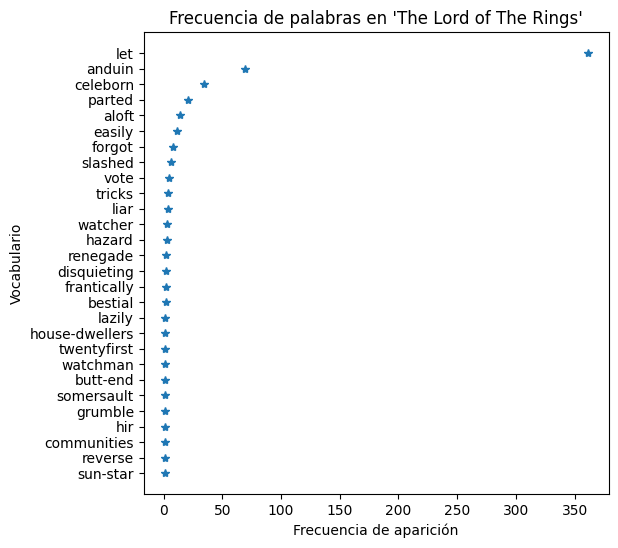

In [14]:
plt.figure(figsize=(6, 6))

words = np.array([w for w in data.freq])
freq = np.array([data.freq[w] for w in data.freq])
ind = np.argsort(freq)[::500]
plt.plot(freq[ind], words[ind], "*")
plt.xlabel("Frecuencia de aparición")
plt.ylabel("Vocabulario");
plt.title("Frecuencia de palabras en 'The Lord of The Rings'")

Armamos nuestros sets de entrenamiento, validación y test. Aunque sea una tarea no supervisada, tenemos que controlar que la red no se aprenda de memoria el contexto para cada palabra y no permita generalizar. Tener en cuenta que en este caso el vocabulario ya está dado desde el principio (no siempre es el caso)

In [15]:
from torch.utils.data import random_split

Ntrain = int(.95*len(data))
Nvalid = int(.025*len(data))
Ntest = len(data) - Ntrain - Nvalid
print(f"{Ntrain} oraciones de entrenamiento, {Nvalid}  para validación y {Ntest} para test\n")
train_data, valid_data, test_data = random_split(data, [Ntrain, Nvalid, Ntest])

BATCH_SIZE = 32

train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
valid_loader = DataLoader(valid_data, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

# Notar que algunas palabras se pierden por el recorte por frecuencia
# de aparición
for k, (context, label, sentence_id) in enumerate(train_loader):
    for ki in range(5):
        print(f"Ejemplo {ki}:", sentences[sentence_id[ki]].strip("\n"))
        print("Contexto:", context[ki, :], data.get_text(context[ki, :]))
        print("Target:", label[ki], data.get_text(label[ki].item()))
        print()

    break

20811 oraciones de entrenamiento, 547  para validación y 549 para test

Ejemplo 0: But it seems impossible, somehow, to feel gloomy or depressed in this place
Contexto: tensor([   6,   47,  536, 6434, 6742,    3,    0,  983]) , to feel gloomy depressed in this place
Target: tensor(139) or

Ejemplo 1: Some people tried to do swaps and deals in the hall; and others tried to make off with minor items not addressed to them, or with anything that seemed unwanted or unwatched
Contexto: tensor([   61,    71,    47,    64,  3057,    16, 13675, 13675]) some people to do swaps and /PAD/ /PAD/
Target: tensor(2905) tried

Ejemplo 2: The flowers glowed red and golden: snap-dragons and sun-flowers, and nasturtiums trailing all over the turf walls and peeping in at the round windows
Contexto: tensor([ 1197,    16,  2339,     3,     4,  1050,  1370, 13675]) walls and peeping in the round windows /PAD/
Target: tensor(169) at

Ejemplo 3: Swift, because they themselves change little, and all else fleets 

## Continuous bag of words (CBOW)
Definición de la red

In [16]:
from torch import nn
from torch.optim import Adam

class Word2VecCBOW(nn.Module):

    def __init__(self, vocab_size, embedding_size, bag_mode="sum"):

        super(Word2VecCBOW, self).__init__()

        # EmbeddingBag es lo mismo que pasar ejemplos por un embedding y luego promediar/sumar, pero más eficiente.
        self.bow = nn.EmbeddingBag(num_embeddings=vocab_size,
                                   embedding_dim=embedding_size,
                                   mode=bag_mode,                  # operación para combinar los embeddings de contexto
                                   padding_idx=-1,                 # padding, no se tiene en cuenta
                                   max_norm=1,                     # norma del vector de embedding
                                   scale_grad_by_freq=True,        # da más peso a las palabras menos frecuentes
                                  )

        self.fc = nn.Linear(embedding_size, vocab_size)

        self.loss = nn.CrossEntropyLoss()

        self.optim = Adam(self.parameters(), lr=1e-4)


    def forward(self, context):

        w = self.bow(context) # bag of words del contexto -> embedding

        y = self.fc(w) # embedding -> palabra target

        return y

    def train_step(self, context, target):

        self.train()
        self.optim.zero_grad()

        target_hat = self(context)
        loss = self.loss(target_hat, target)

        loss.backward()
        self.optim.step()

        return loss.item()

    def test_step(self, context, target):

        self.eval()

        target_hat = self(context)
        loss = self.loss(target_hat, target)

        return loss.item()

    def get_embedding(self, ind=None):
        if ind is None:
            return self.bow.weight
        else:
            return self.bow.weight[ind, :]

EMB_SIZE = 300
Word2VecCBOW(data.vocab_size, EMB_SIZE)

Word2VecCBOW(
  (bow): EmbeddingBag(13676, 300, max_norm=1, scale_grad_by_freq=True, mode='sum', padding_idx=13675)
  (fc): Linear(in_features=300, out_features=13676, bias=True)
  (loss): CrossEntropyLoss()
)

## Entrenamiento

In [17]:
net = Word2VecCBOW(data.vocab_size, EMB_SIZE)
DEVICE = "cuda" if tr.cuda.is_available() else "cpu"
net.to(DEVICE)

log = []
epoch = 0
max_epochs = 1000
best_loss = 1e10

epoch_iterator = tqdm(range(max_epochs))
patience_count = 0
for epoch in epoch_iterator:
    train_loss, valid_loss = 0, 0
    for context, label, _ in train_loader:
        train_loss += net.train_step(context.to(DEVICE), label.to(DEVICE))

    train_loss = train_loss/len(train_loader)

    for context, label, _ in valid_loader:
        valid_loss += net.test_step(context.to(DEVICE), label.to(DEVICE))

    valid_loss = valid_loss/len(valid_loader)

    log.append([train_loss, valid_loss])

    # early stop: si el loss de validación no baja al menos el 1% en 10 epocas
    if valid_loss >= best_loss*.99:
        patience_count += 1

    if epoch > max_epochs or patience_count > 50:
        break

    if valid_loss < best_loss:
        # Si mejora el loss en validación, se guarda el modelo
        best_loss = valid_loss
        best_epoch = epoch
        patience_count = 0
        tr.save(net.state_dict(), f"cbow_lotr_embedding.par")

    epoch_iterator.set_postfix({'train': train_loss,
                                'valid': valid_loss})




  0%|          | 0/1000 [00:00<?, ?it/s]

## Test

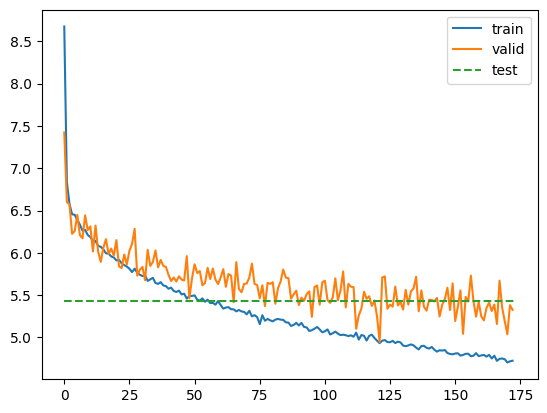

In [18]:
DEVICE = "cuda" if tr.cuda.is_available() else "cpu"
# Cargamos el mejor modelo
net = Word2VecCBOW(len(data.vocab), EMB_SIZE)
net.to(DEVICE)
net.load_state_dict(tr.load(f"cbow_lotr_embedding.par"))
net.eval()

test_loss = 0
for context, label, _ in test_loader:
    test_loss += net.test_step(context.to(DEVICE), label.to(DEVICE))

test_loss = test_loss/len(test_loader)

plt.plot(log)
plt.plot([0, len(log)], [test_loss, test_loss], "--")
plt.legend(["train", "valid", "test"]);

### Vecinos más cercanos
Podemos listar las palabras más cercanas según nuestro embedding

In [20]:
target = "ring"
#target = "mordor"
#target = "barad-dûr"
#target = "sauron"
#target = "rivendell"
#target = "frodo"
#target = "sky"
#target = "lembas"

target_emb = net.get_embedding(data.vocab[target])

# Medimos la similaridad entre target y todo el corpus
cosine_similarity = tr.zeros(data.vocab_size)
for k in range(data.vocab_size):
    cosine_similarity[k] = nn.functional.cosine_similarity(target_emb, net.get_embedding(k), dim=0)

# print(f'Embbeding seleccionado {target_emb}')
print(f"Palabras más cercanas a '{target}':")
#for k in tr.argsort(csim)[:10]:
for k in tr.argsort(cosine_similarity, descending=True)[:10]:
    print(f"({cosine_similarity[k]:.2f}) {data.inverse_vocab[k.item()]}")

Palabras más cercanas a 'ring':
(1.00) ring
(0.57) enemy
(0.53) shire
(0.48) story
(0.48) hero
(0.48) burden
(0.47) contrary
(0.47) hilt
(0.46) gaffer
(0.46) king


## Analogías

In [21]:
# x1 es a y1, como x2 es a y2
# x1 - y1 ~ x2 - y2
# y1 - x1 + x2 ~ y2

x1 = net.get_embedding(data.vocab["bilbo"]).detach().cpu()
y1 = net.get_embedding(data.vocab["hobbit"]).detach().cpu()
x2 = net.get_embedding(data.vocab["legolas"]).detach().cpu()

#x1 = net.get_embedding(data.vocab["sauron"]).detach().cpu()
#y1 = net.get_embedding(data.vocab["mordor"]).detach().cpu()
#x2 = net.get_embedding(data.vocab["bilbo"]).detach().cpu()


y2 = y1 - x1 + x2

y2 = y2.cuda()
# Medimos la similaridad entre target y todo el corpus
cosine_similarity = tr.zeros(data.vocab_size)
for k in range(data.vocab_size):
    cosine_similarity[k] = nn.functional.cosine_similarity(y2, net.get_embedding(k), dim=0)

print(f"Palabras más cercanas a y:")
#for k in tr.argsort(csim)[:10]:
for k in tr.argsort(cosine_similarity, descending=True)[:10]:
    print(f"{data.inverse_vocab[k.item()]} ({cosine_similarity[k]: .2f})")

Palabras más cercanas a y:
hobbit ( 0.56)
legolas ( 0.54)
dwarf ( 0.53)
elf ( 0.49)
riddle ( 0.44)
landlord ( 0.40)
paddle ( 0.40)
gimli ( 0.40)
balrog ( 0.39)
heralds ( 0.39)


In [22]:
!pip install umap-learn

In [23]:
from umap import UMAP

embeddings = net.get_embedding().detach().cpu().numpy()
model = UMAP(n_components=2)
emb_umap = model.fit_transform(embeddings - np.mean(embeddings, axis=1, keepdims=True))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


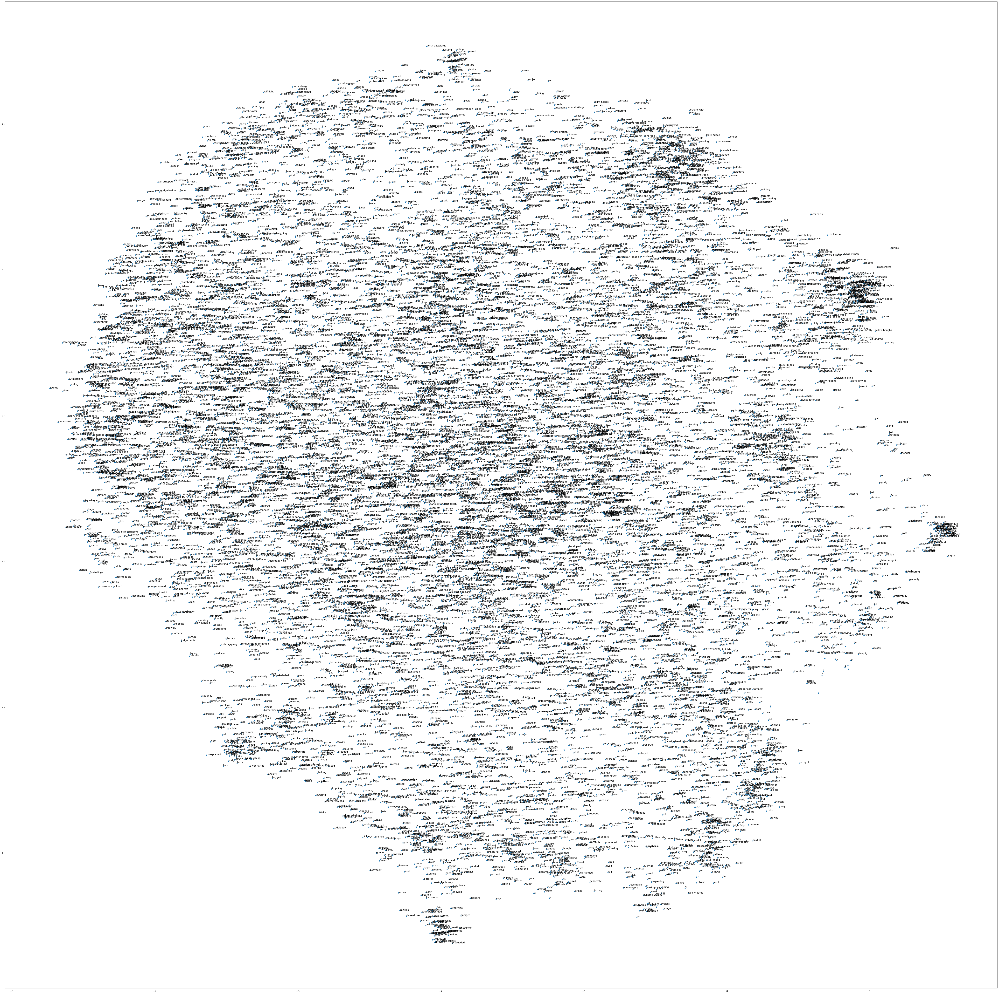

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(75, 75))
ax.plot(emb_umap[:, 0], emb_umap[:, 1], "*")
for k in range(data.vocab_size):
    ax.annotate(data.inverse_vocab[k], (emb_umap[k, 0], emb_umap[k, 1]))
plt.savefig("word-embeddings-lotr.png", dpi=200)
plt.show()
plt.close(fig)